# Archelec — Topic Modeling sur l'extrême droite (1973-1978-1981–1988–1993)

## Contexte de recherche

Ce notebook analyse les **professions de foi** (PF) des candidats d'extrême droite aux élections législatives françaises de **1973 à 1993**, issues du corpus Archelec (CEVIPOF / Sciences Po). Il a été construit sur les bases du Notebook fait par Jonas Lechat (travail en groupe), mais avec des changements sur certaines parties et l'inclusion de l'année 1973. 

---
## Chargement des données pre-traitées d'extrême droite

Chargement à partir de la base de données générée (cleaned_data - généré grace au main.py)

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import textwrap
from cleaning_data.processing import stopwords
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
import matplotlib.ticker as mtick
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import linkage, cophenet
import pyLDAvis, pyLDAvis.lda_model

from sklearn.decomposition import NMF


import numpy as np

In [2]:
df_ed = pd.read_csv("data/cleaned_data.csv")

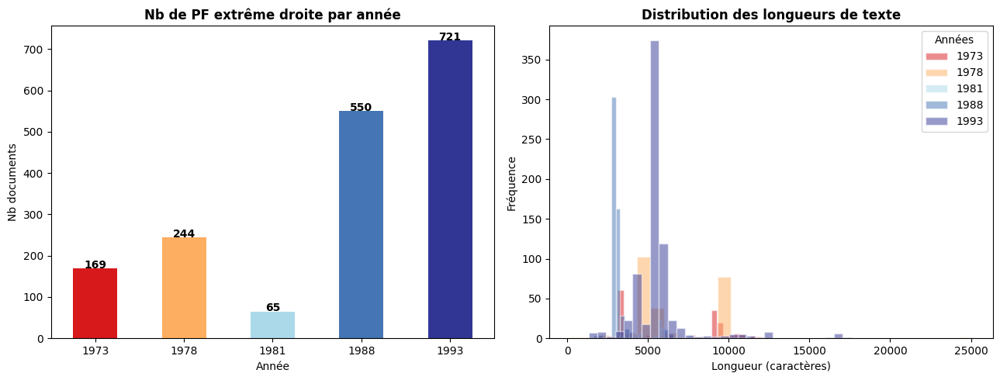

In [3]:
# Visualisation des données 
fig, axes = plt.subplots(1, 2, figsize=(13, 5))

# Palette de 5 couleurs (nuances de rouge, orange, bleu clair, bleu moyen, bleu foncé)
# Cette palette suit la logique ColorBrewer "RdYlBu"
colors = ['#d7191c', '#fdae61', '#abd9e9', '#4575b4', '#313695']

# Liste des années cibles
years_list = [1973, 1978, 1981, 1988, 1993]

# --- Graphique 1 : Barres ---
counts = df_ed['year'].value_counts().sort_index()
# On s'assure que le nombre de couleurs correspond au nombre de barres
counts.plot(kind='bar', ax=axes[0], color=colors[:len(counts)])

axes[0].set_title('Nb de PF extrême droite par année', fontweight='bold')
axes[0].set_xlabel('Année') 
axes[0].set_ylabel('Nb documents')
axes[0].tick_params(axis='x', rotation=0)

for i, v in enumerate(counts):
    axes[0].text(i, v + 0.3, str(v), ha='center', fontweight='bold')

# --- Graphique 2 : Histogrammes ---
for year, color in zip(years_list, colors):
    sub = df_ed[df_ed['year'] == year]['text_length']
    if len(sub) > 0:
        axes[1].hist(sub, bins=30, alpha=0.5, label=str(year), color=color, edgecolor='white')

axes[1].set_title('Distribution des longueurs de texte', fontweight='bold')
axes[1].set_xlabel('Longueur (caractères)') 
axes[1].set_ylabel('Fréquence')
axes[1].legend(title="Années")

plt.tight_layout()
plt.savefig('corpus_overview.png', dpi=150, bbox_inches='tight')
plt.show()

In [4]:
# Aperçu qualitatif
print("\n" + "="*65)
print("APERÇU — 3 exemples de PF extrême droite identifiées")
print("="*65)
for _, row in df_ed.sample(n=min(3, len(df_ed)), random_state=42).iterrows():
    print(f"\n[{row['year']} | {row.get('titulaire-prenom','')} "
          f"{row.get('titulaire-nom','')} | Parti : {row['titulaire-liste']}]")
    print(textwrap.fill(row['text'][:400], width=88))


APERÇU — 3 exemples de PF extrême droite identifiées

[1988 | Jean-Etienne Normand | Parti : Liste entente populaire et nationale]
7raisons de voter pour le candidat du Front National Sciences Po / fonds CEVIPOF Jean-
Etienne NORMAND graphica/lons Chevalier de l'Ordre National du Mérite Si vous voulez un
député · qui soit présent à l'Assemblée nationale et qui remplisse effectivement le
mandat pour lequel les contribuables le payent, comme les députés du Front National
l'ont fait jusqu'ici à la différence de leurs collègues de

[1993 | André Guyomar | Parti : non mentionné]
Sciences Po / fonds CEVIPOF ÉLECTIONS LÉGISLATIVES DE MARS 1993 - 3e CIRCONSCRIPTION DU
MORBIHAN FRONT NATIONAL LES FRANÇAIS D'ABORD ! LE PEN avec Jean-Marie VOTEZ André
GUYOMAR 70 ans - marié - 1 enfant Capitaine au Long-Cours (E.R.) Officier du mérite
maritime Conseiller Régional de Bretagne SUPPLÉANT Georges IGLESIAS-MELICH Chers
compatriotes, Chômage, insécurité, immigration, pauvreté, impôts,

[1988 | Henri Ba

---
## LDA (Latent Dirichlet Allocation)
D'abord- on va tenter d'identifier le nombre optimal de clusters à l'aide du graphique "coude". Puis on utilise `CountVectorizer` (comptage brut) avec des **bigrammes** pour capturer les expressions composées caractéristiques de l'extrème droite (i.e. `préférence nationale`, `chômage immigrés`, `insécurité quotidienne`...).

In [5]:

ALL_SW = stopwords()

c:\Users\Utilisateur\Documents\ENSAE\3A\nlp\nlp-project\NLP_project\.venv\Lib\site-packages\sklearn\feature_extraction\text.py:411: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['po', 'quelqu', 'sciences'] not in stop_words.
  warnings.warn(


Calcul terminé pour n_topics = 3
Calcul terminé pour n_topics = 5
Calcul terminé pour n_topics = 6
Calcul terminé pour n_topics = 7
Calcul terminé pour n_topics = 8
Calcul terminé pour n_topics = 10
Calcul terminé pour n_topics = 12
Calcul terminé pour n_topics = 15
Calcul terminé pour n_topics = 20


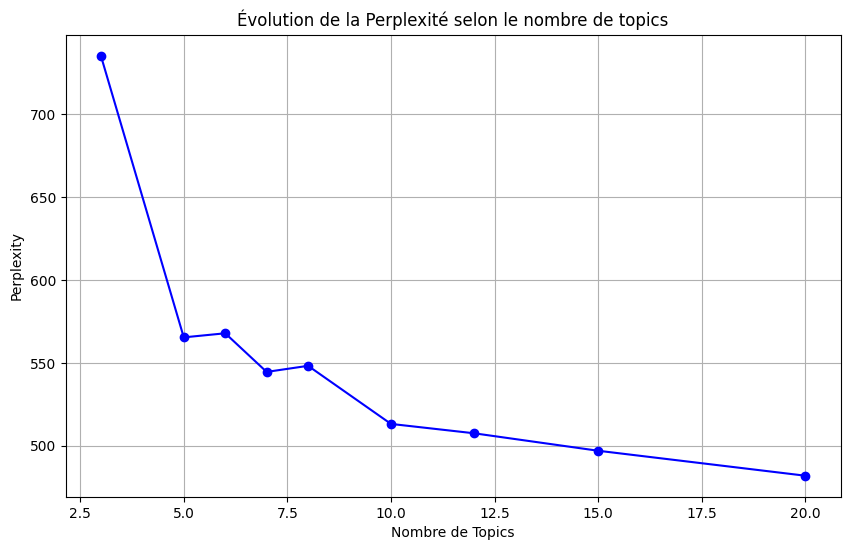

In [6]:


N_FEATURES = 2000
tf_vectorizer = CountVectorizer(
    max_features=N_FEATURES,
    stop_words=list(ALL_SW),
    min_df=2, max_df=0.9,
    ngram_range=(1, 2)
)
tf_matrix = tf_vectorizer.fit_transform(df_ed['text_lemmatized'])

# Recherche du nombre optimal de topics
topics_range = [3, 5, 6, 7,8, 10, 12 ,15, 20] # Liste des valeurs à tester
perplexity_scores = []

for n_topics in topics_range:
    lda = LatentDirichletAllocation(
        n_components=n_topics,
        max_iter=10, # On réduit un peu les itérations pour gagner du temps en phase de test
        learning_method='batch',
        random_state=42,
        n_jobs=-1
    )
    lda.fit(tf_matrix)
    perplexity_scores.append(lda.perplexity(tf_matrix))
    print(f"Calcul terminé pour n_topics = {n_topics}")

# Visualisation
plt.figure(figsize=(10, 6))
plt.plot(topics_range, perplexity_scores, marker='o', linestyle='-', color='b')
plt.title("Évolution de la Perplexité selon le nombre de topics")
plt.xlabel("Nombre de Topics")
plt.ylabel("Perplexity")
plt.grid(True)
plt.show()

In [36]:

N_FEATURES = 2000   # taille du vocabulaire
N_TOPICS   = 5   # nombre de sujets

# ── Vectorisation CountVectorizer ─────────────────────────────────────────────
# Choix des paramètres
# ngram_range=(1,2) : unigrammes ET bigrammes
# min_df=2          : un terme doit apparaître dans ≥2 documents (filtre le bruit OCR)
# max_df=0.9        : ignorer les termes dans >90% des docs (trop généraux)
tf_vectorizer = CountVectorizer(
    max_features=N_FEATURES,
    stop_words=list(ALL_SW),
    min_df=2, max_df=0.9,
    ngram_range=(1, 2)
)
tf_matrix = tf_vectorizer.fit_transform(df_ed['text_lemmatized'])

# ── Entraînement LDA ──────────────────────────────────────────────────────────
# On entraine le modèle sur nos données
lda = LatentDirichletAllocation(
    n_components=N_TOPICS,
    max_iter=20,
    learning_method='batch',
    random_state=42,
    n_jobs=-1
)
lda.fit(tf_matrix)

# On affiche les mots les plus importants pour chaque sujet
feat_names = tf_vectorizer.get_feature_names_out()

for i, topic in enumerate(lda.components_):
    top = [feat_names[j] for j in np.argsort(-topic)[:15]]
    print(f"\nTopic {i+1:02d} : {', '.join(top)}")


Topic 01 : politique, majorité, pays, gauche, loi, parti, pouvoir, faire, etat, travailleur, mesure, public, homme, vie, devoir

Topic 02 : emploi, impôt, famille, chômage, enfant, défense, priorité, main, libre, travail, insécurité, taxe, entreprise, étranger, propre

Topic 03 : rétablir, impôt, voix, million, immigré, retraite, sauver, carte, supprimer, chômage, main, créer, nationalité, lutter, organiser

Topic 04 : avenir, vivre, populaire, confiance, conviction, liste, suppression, république, famille, françois, mère, groupe, droit, mère famille, socialisme

Topic 05 : public, liberté, enseignement, famille, majorité, moyen, loi, véritable, justice, justice social, million, travail, gauche, patrie, inflation


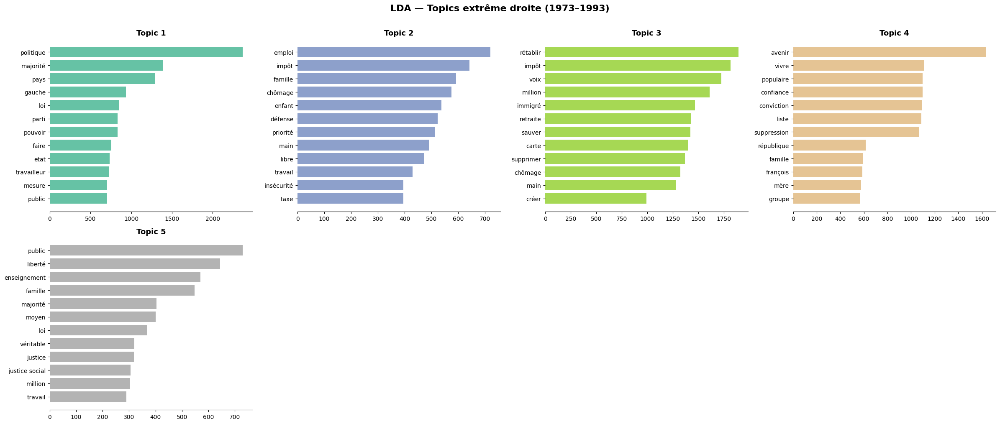

In [37]:
def plot_top_words(model, vectorizer, n_top, title, nb_cols=4):
    """Graphique en barres horizontales — top mots par topic."""
    fn   = vectorizer.get_feature_names_out()
    n_t  = len(model.components_)
    cols = min(nb_cols, n_t)
    rows = (n_t + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(cols*6, rows*5))
    axes = axes.flatten() if n_t > 1 else [axes]
    pal  = plt.cm.Set2(np.linspace(0, 1, n_t))
    for idx, topic in enumerate(model.components_):
        top_i = topic.argsort()[-n_top:]
        ax    = axes[idx]
        ax.barh(fn[top_i], topic[top_i], color=pal[idx])
        ax.set_title(f"Topic {idx+1}", fontsize=13, fontweight='bold')
        ax.tick_params(labelsize=10)
        for sp in ['top','right','left']: ax.spines[sp].set_visible(False)
    for i in range(n_t, len(axes)): axes[i].set_visible(False)
    fig.suptitle(title, fontsize=16, fontweight='bold', y=1.01)
    plt.tight_layout() ; plt.show()


plot_top_words(lda, tf_vectorizer, 12,
               "LDA — Topics extrême droite (1973–1993)")

In [ ]:

pyLDAvis.enable_notebook()

# Visualisation interactive :
# Taille des bulles = importance du topic dans le corpus
# Distance entre bulles = similarité (topics proches = similaires)
pyLDAvis.lda_model.prepare(lda, tf_matrix, tf_vectorizer)

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2     -0.308893 -0.069834       1        1  38.120038
3      0.109482  0.351369       2        1  21.912666
0      0.125414 -0.051225       3        1  19.435021
4      0.238038 -0.227308       4        1  11.361080
1     -0.164042 -0.003001       5        1   9.171195, topic_info=           Term         Freq        Total Category  logprob  loglift
1313  politique  3230.000000  3230.000000  Default  30.0000  30.0000
861       impôt  2590.000000  2590.000000  Default  29.0000  29.0000
562      emploi  2165.000000  2165.000000  Default  28.0000  28.0000
1044   majorité  2218.000000  2218.000000  Default  27.0000  27.0000
1035       main  1866.000000  1866.000000  Default  26.0000  26.0000
...         ...          ...          ...      ...      ...      ...
840     immigré   319.452045  3105.703862   Topic5  -5.2926   0.1147
1328  populaire   304.311942  2378.397880   Topic5  -5.3412   0.3330
1608  réduction   275.295334  1005.295418   Topic5  -5.4414   1.0939
1143       mort   281.643030  1929.632727   Topic5  -5.4186   0.4647
1269       pays   278.206976  2718.141963   Topic5  -5.4309   0.1098

[370 rows x 6 columns], token_table=      Topic      Freq            Term
term                                 
3         4  0.996339          abolir
18        3  0.326582          accord
18        4  0.636330          accord
18        5  0.037035          accord
35        1  0.020597        activité
...     ...       ...             ...
1990      2  0.376764        étranger
1990      3  0.232579        étranger
1990      4  0.115203        étranger
1990      5  0.275327        étranger
1999      1  0.997605  œuvre immigrer

[692 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 4, 1, 5, 2])

Sous-corpus FN : 1481 documents | années : [np.int64(1973), np.int64(1978), np.int64(1981), np.int64(1988), np.int64(1993)]


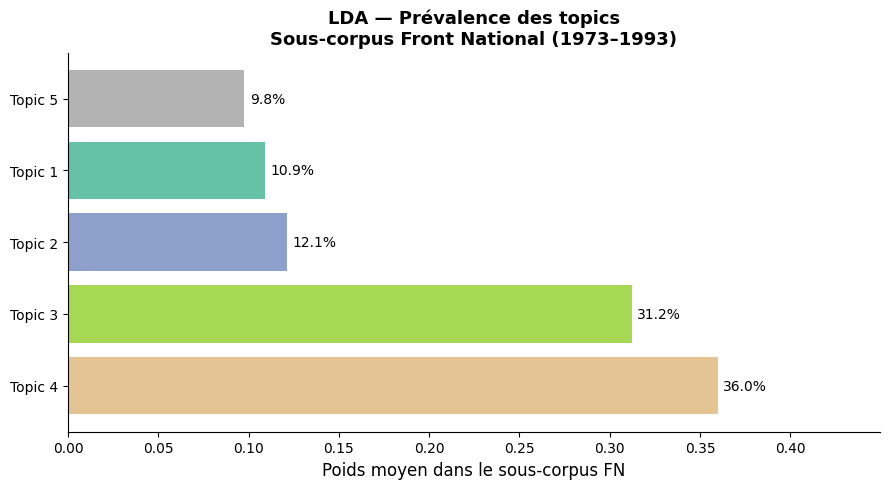

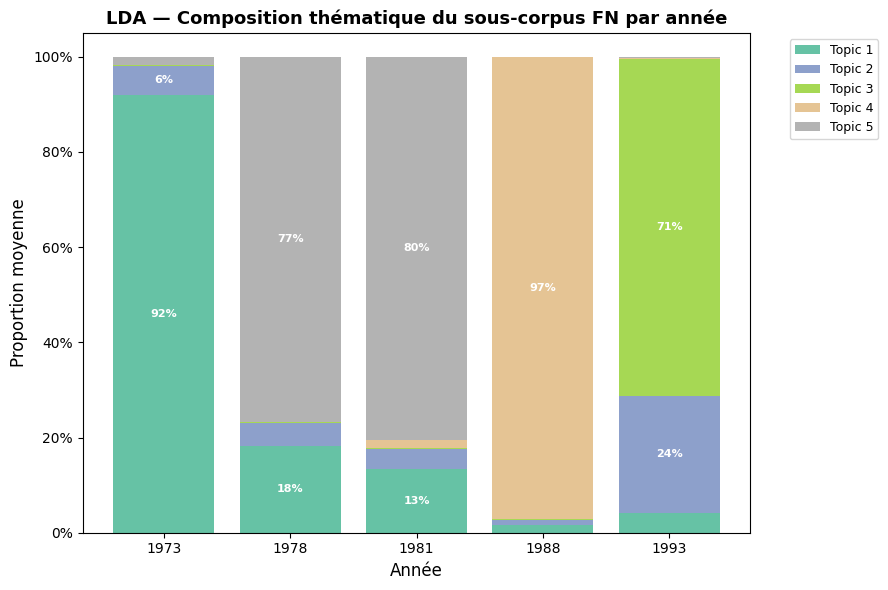

In [40]:
# ── Filtrage Front National ───────────────────────────────────────────────────
fn_mask = (
    df_ed.get('titulaire-soutien', pd.Series(dtype=str)).fillna('').str.contains('Front National', case=False, regex=False)
    | df_ed.get('titulaire-liste', pd.Series(dtype=str)).fillna('').str.contains('Front National', case=False, regex=False)
)
df_fn = df_ed[fn_mask].copy()
print(f"Sous-corpus FN : {len(df_fn)} documents | années : {sorted(df_fn['year'].unique())}")

# ── Projection sur le vocabulaire LDA (CountVectorizer déjà fittté) ──────────
tf_fn = tf_vectorizer.transform(df_fn['text_lemmatized'])

# Distribution des topics pour chaque doc FN
W_lda_fn = lda.transform(tf_fn)          # shape (n_fn, N_TOPICS)
W_lda_fn_norm = W_lda_fn / W_lda_fn.sum(axis=1, keepdims=True)

# ── Graphique 1 : prévalence moyenne globale (barres horizontales) ────────────
mean_lda_fn = W_lda_fn_norm.mean(axis=0)
pal_lda = plt.cm.Set2(np.linspace(0, 1, N_TOPICS))

fig, ax = plt.subplots(figsize=(9, 5))
topic_idx = np.argsort(-mean_lda_fn)
labels_lda = [f"Topic {i+1}" for i in topic_idx]
bars = ax.barh(labels_lda, mean_lda_fn[topic_idx], color=[pal_lda[i] for i in topic_idx])
ax.bar_label(bars, fmt=lambda v: f'{v:.1%}', padding=4, fontsize=10)
ax.set_xlabel('Poids moyen dans le sous-corpus FN', fontsize=12)
ax.set_title('LDA — Prévalence des topics\nSous-corpus Front National (1973–1993)',
             fontsize=13, fontweight='bold')
ax.set_xlim(0, mean_lda_fn.max() * 1.25)
for sp in ['top', 'right']: ax.spines[sp].set_visible(False)
plt.tight_layout()
plt.savefig('fn_lda_prevalence.png', dpi=150, bbox_inches='tight')
plt.show()



for t in range(N_TOPICS):
    df_fn[f'lda_t{t}'] = W_lda_fn_norm[:, t]

lda_cols = [f'lda_t{t}' for t in range(N_TOPICS)]
by_year_fn_lda = df_fn.groupby('year')[lda_cols].mean()
years_fn = sorted(by_year_fn_lda.index.tolist())

fig, ax = plt.subplots(figsize=(9, 6))
bottom = np.zeros(len(years_fn))
xlabels = [str(y) for y in years_fn]

for i in range(N_TOPICS):
    col = f'lda_t{i}'
    vals = by_year_fn_lda.loc[years_fn, col].values
    ax.bar(xlabels, vals, bottom=bottom, label=f'Topic {i+1}', color=pal_lda[i])
    for xi, (v, b) in enumerate(zip(vals, bottom)):
        if v > 0.05:
            ax.text(xi, b + v / 2, f'{v:.0%}', ha='center', va='center',
                    fontsize=8, color='white', fontweight='bold')
    bottom += vals

ax.set_xlabel('Année', fontsize=12)
ax.set_ylabel('Proportion moyenne', fontsize=12)
ax.set_title('LDA — Composition thématique du sous-corpus FN par année',
             fontsize=13, fontweight='bold')
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
ax.set_ylim(0, 1.05)
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9)
plt.tight_layout()
plt.savefig('fn_lda_stacked.png', dpi=150, bbox_inches='tight')
plt.show()


---
## Étape 5 — NMF (Non-negative Matrix Factorization)


k=5 : Error=523.64, BIC=4.14e+05, Cophenetic=0.960
k=8 : Error=449.80, BIC=4.26e+05, Cophenetic=0.965
k=10 : Error=418.08, BIC=4.55e+05, Cophenetic=0.955
k=15 : Error=358.77, BIC=5.49e+05, Cophenetic=0.978
k=20 : Error=323.15, BIC=6.64e+05, Cophenetic=0.982
k=25 : Error=307.81, BIC=7.95e+05, Cophenetic=0.977


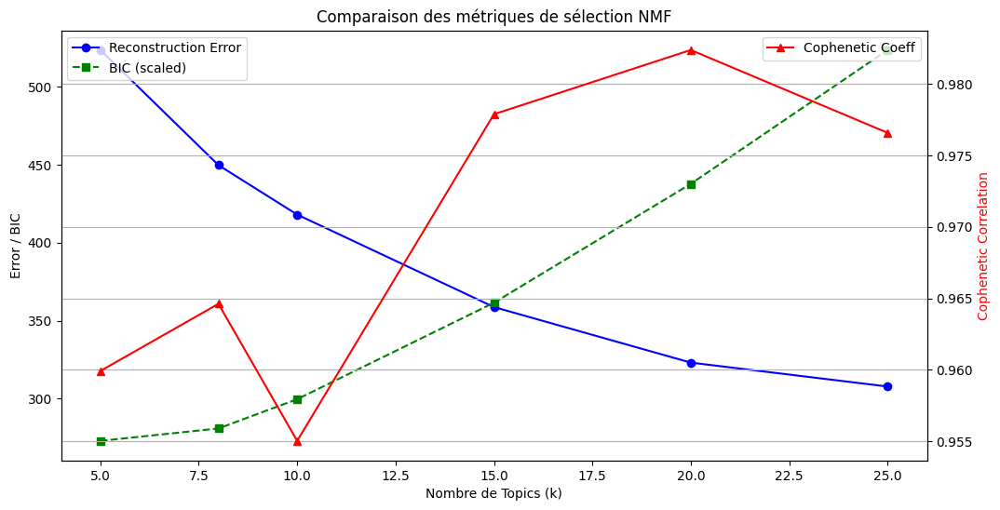

In [ ]:


def calculate_bic(reconstruction_err, n_samples, n_features, n_topics):
    """
    Calcule une approximation du BIC pour la NMF.
    On pénalise la log-vraisemblance par le nombre de paramètres (W + H).
    """
    # Nombre total de paramètres dans le modèle
    n_params = n_topics * (n_samples + n_features)
    # Approximation du BIC
    bic = reconstruction_err**2 + n_params * np.log(n_samples)
    return bic

def calculate_cophenetic(W):
    """
    Calcule le coefficient de corrélation cophenétique basé sur la matrice W.
    Mesure à quel point le clustering préserve les distances originales.
    """
    z = linkage(W, method='average')
    c, coph_dists = cophenet(z, pdist(W))
    return c

topics_range = [5, 8, 10, 15, 20, 25]
results = []

n_samples, n_features = tf_matrix.shape

for k in topics_range:
    nmf_model = NMF(n_components=k, init='nndsvda', random_state=42, max_iter=400)
    W = nmf_model.fit_transform(tf_matrix)
    
    # 1. Reconstruction Error (déjà incluse)
    err = nmf_model.reconstruction_err_
    
    # 2. BIC
    bic = calculate_bic(err, n_samples, n_features, k)
    
    # 3. Cophenetic Correlation
    coph = calculate_cophenetic(W)
    
    results.append({'k': k, 'error': err, 'bic': bic, 'cophenetic': coph})
    print(f"k={k} : Error={err:.2f}, BIC={bic:.2e}, Cophenetic={coph:.3f}")

df_results = pd.DataFrame(results)

fig, ax1 = plt.subplots(figsize=(12, 6))

# Axe gauche : Error et BIC
ax1.plot(df_results['k'], df_results['error'], 'b-o', label='Reconstruction Error')
ax1.plot(df_results['k'], df_results['bic'] / df_results['bic'].max() * df_results['error'].max(), 'g--s', label='BIC (scaled)')
ax1.set_xlabel('Nombre de Topics (k)')
ax1.set_ylabel('Error / BIC', color='k')

# Axe droit : Cophenetic
ax2 = ax1.twinx()
ax2.plot(df_results['k'], df_results['cophenetic'], 'r-^', label='Cophenetic Coeff')
ax2.set_ylabel('Cophenetic Correlation', color='r')

plt.title("Comparaison des métriques de sélection NMF")
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
plt.grid(True)
plt.show()

In [41]:
# Au vue des ressources de computation et l'interpertabilité, 8 smeble être un compromis acceptable ! 
N_TOPICS_NMF = 8
# ── Vectorisation TF-IDF ──────────────────────────────────────────────────────
tfidf_vectorizer = TfidfVectorizer(
    max_features=N_FEATURES,
    stop_words=list(ALL_SW),
    min_df=2,
    max_df=0.9,
    ngram_range=(1, 2),
    sublinear_tf=True
)

tfidf_matrix = tfidf_vectorizer.fit_transform(df_ed['text_lemmatized'])

# récupérer les mots
fn_tfidf = tfidf_vectorizer.get_feature_names_out()

# ── Entraînement NMF ──────────────────────────────────────────────────────────
nmf = NMF(
    n_components=N_TOPICS_NMF,
    init='nndsvda',
    random_state=42,
    max_iter=400
)

W = nmf.fit_transform(tfidf_matrix)

# ── Top mots par topic ────────────────────────────────────────────────────────
for i, topic in enumerate(nmf.components_):

    top_idx = np.argsort(topic)[::-1][:20]

    top_words = [fn_tfidf[j] for j in top_idx]

    print(f"\nTopic {i+1:02d} : {', '.join(top_words)}")

c:\Users\Utilisateur\Documents\ENSAE\3A\nlp\nlp-project\NLP_project\.venv\Lib\site-packages\sklearn\feature_extraction\text.py:411: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['po', 'quelqu', 'sciences'] not in stop_words.
  warnings.warn(



Topic 01 : conviction, liste, vivre, confiance, suppression, avenir, confirmer, lepen, france vivre, redressement, vivre république, appel français, enseignement suppression, presque absent, quota maintien, suppression quota, absent élu, terre lutte, clairement union, antisocialiste préférence

Topic 02 : carte, sauver, rétablir, retraite, impôt, million, supprimer, renouvelable, séjour renouvelable, carte séjour, français emploi, séjour, sauver agriculture, famille françaises, écologiste, main, proteger, traité, chômage insécurité, françaises

Topic 03 : alliance populaire, formation, refus, etat, restaurer etat, formation général, humiliation, passage, mixte, mise, aménagement, instauration, place, mettre place, américain, duction, alliance, rôle, mise œuvre, nation

Topic 04 : catastrophique, rigoureux, justice social, inflation, production, qualité, loi, defendre, patrie, activité, développer, élire, public, véritable, enseignement, survivre, liberté, code pénal, montée, pénal

To

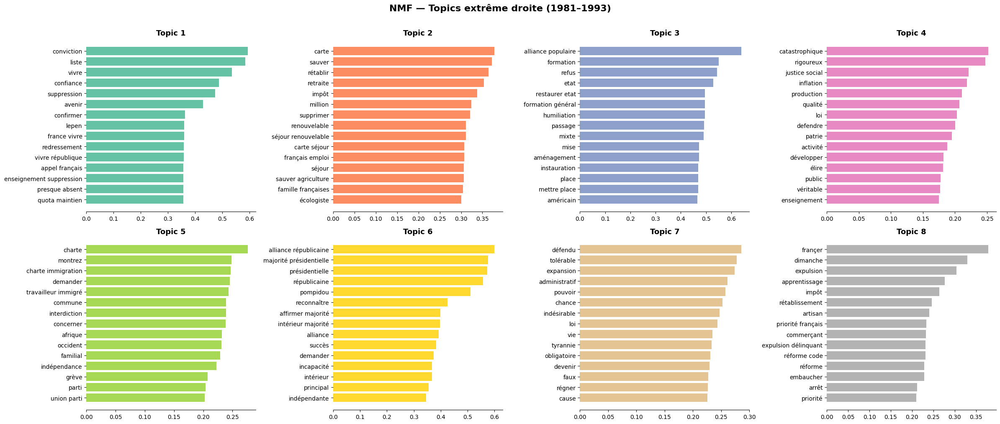

In [42]:
plot_top_words(nmf, tfidf_vectorizer, 15,
               "NMF — Topics extrême droite (1981–1993)")

In [22]:
# ── Étiquetage manuel des topics pour les visualisations suivantes ──────────────────────────────────────────────
topic_labels = {
    0: 'Promesse et alliance',
    1: 'Encadrer immigration',
    2: 'Discours nationaliste',
    3: 'Loi et programme économique',
    4: 'Famille et anti-immigation',
    5: 'Faire front',
    6: 'Opposition au pouvoir',
    7: 'Sécurité au niveau local',
}

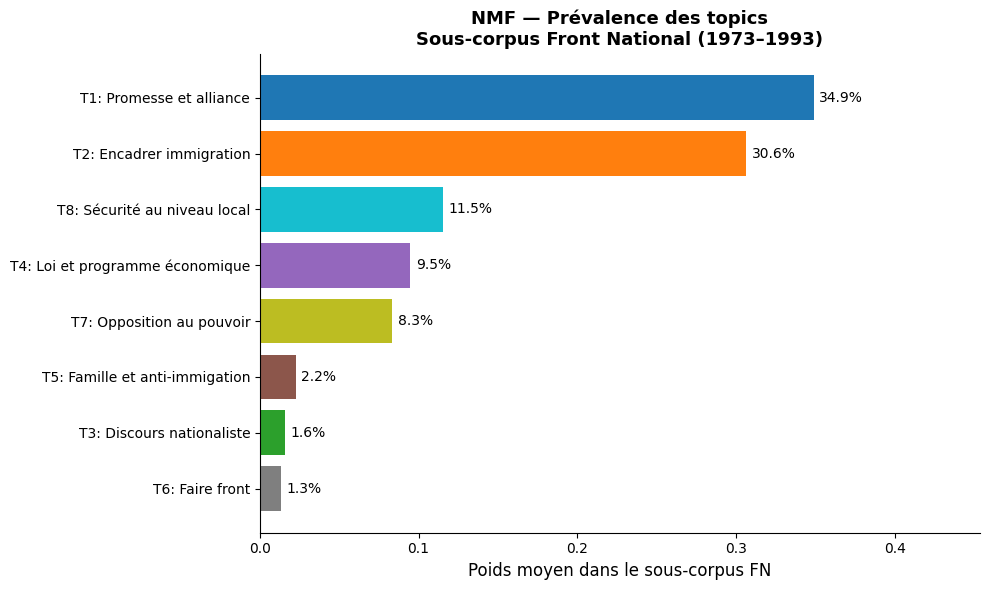

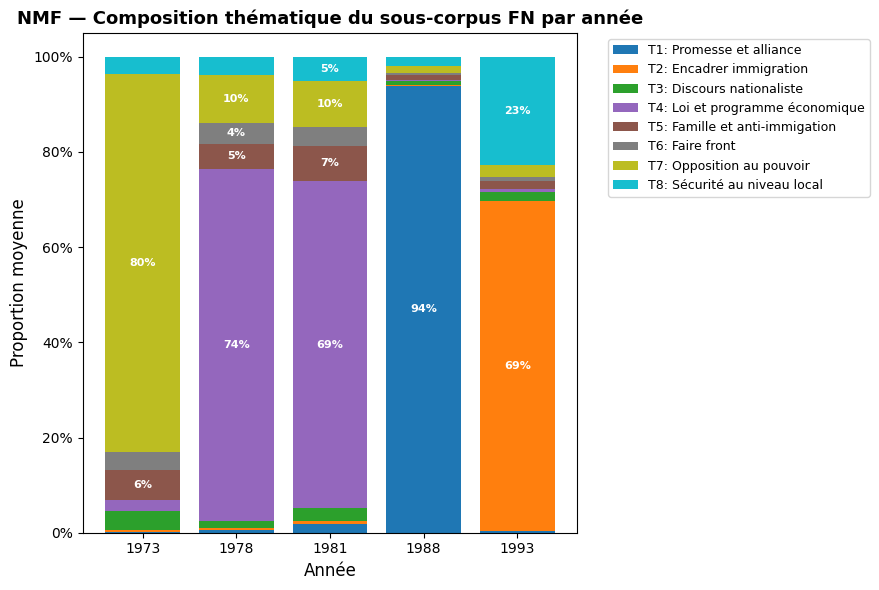

In [ ]:
# ── Projection NMF sur le sous-corpus FN ─────────────────────────────────────
# On réutilise le tfidf_vectorizer et le modèle nmf entraînés sur le corpus complet
tfidf_fn = tfidf_vectorizer.transform(df_fn['text_lemmatized'])
W_nmf_fn = nmf.transform(tfidf_fn)           # shape (n_fn, N_TOPICS_NMF)
W_nmf_fn_norm = W_nmf_fn / (W_nmf_fn.sum(axis=1, keepdims=True) + 1e-10)

pal_nmf = plt.cm.tab10(np.linspace(0, 1, N_TOPICS_NMF))

# Prévalence
mean_nmf_fn = W_nmf_fn_norm.mean(axis=0)
order = np.argsort(-mean_nmf_fn)
labels_nmf = [f"T{i+1}: {topic_labels.get(i, '?')}" for i in order]

fig, ax = plt.subplots(figsize=(10, 6))
bars = ax.barh(labels_nmf, mean_nmf_fn[order], color=[pal_nmf[i] for i in order])
ax.bar_label(bars, fmt=lambda v: f'{v:.1%}', padding=4, fontsize=10)
ax.set_xlabel('Poids moyen dans le sous-corpus FN', fontsize=12)
ax.set_title('NMF — Prévalence des topics\nSous-corpus Front National (1973–1993)',
             fontsize=13, fontweight='bold')
ax.set_xlim(0, mean_nmf_fn.max() * 1.3)
ax.invert_yaxis()   # topic le plus prévalent en haut
for sp in ['top', 'right']: ax.spines[sp].set_visible(False)
plt.tight_layout()
plt.savefig('fn_nmf_prevalence.png', dpi=150, bbox_inches='tight')
plt.show()

# Stacked bars
for t in range(N_TOPICS_NMF):
    df_fn[f'nmf_t{t}'] = W_nmf_fn_norm[:, t]

nmf_cols = [f'nmf_t{t}' for t in range(N_TOPICS_NMF)]
by_year_fn_nmf = df_fn.groupby('year')[nmf_cols].mean()
years_fn_nmf = sorted(by_year_fn_nmf.index.tolist())

fig, ax = plt.subplots(figsize=(9, 6))
bottom = np.zeros(len(years_fn_nmf))
xlabels = [str(y) for y in years_fn_nmf]

for i in range(N_TOPICS_NMF):
    col = f'nmf_t{i}'
    vals = by_year_fn_nmf.loc[years_fn_nmf, col].values
    label = f"T{i+1}: {topic_labels.get(i, '?')}"
    ax.bar(xlabels, vals, bottom=bottom, label=label, color=pal_nmf[i])
    for xi, (v, b) in enumerate(zip(vals, bottom)):
        if v > 0.04:
            ax.text(xi, b + v / 2, f'{v:.0%}', ha='center', va='center',
                    fontsize=8, color='white', fontweight='bold')
    bottom += vals

ax.set_xlabel('Année', fontsize=12)
ax.set_ylabel('Proportion moyenne', fontsize=12)
ax.set_title('NMF — Composition thématique du sous-corpus FN par année',
             fontsize=13, fontweight='bold')
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
ax.set_ylim(0, 1.05)
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9)
plt.tight_layout()
plt.savefig('fn_nmf_stacked.png', dpi=150, bbox_inches='tight')
plt.show()


---
## Étape 6 — Analyse temporelle

La matrice W donne le poids de chaque topic dans chaque document. En agrégeant par année, on peut observer si certains thèmes montent, descendent ou disparaissent.

In [23]:
# ── Normalisation de W ────────────────────────────────────────────────────────
# On normalise chaque ligne pour avoir des proportions (somme = 1 par document)
W_norm = W / W.sum(axis=1, keepdims=True)

# Ajouter au DataFrame
for t in range(N_TOPICS_NMF):
    df_ed[f't{t}'] = W_norm[:, t]
df_ed['dominant_topic']       = np.argmax(W_norm, axis=1)
df_ed['dominant_score']       = np.max(W_norm, axis=1)
df_ed['dominant_label']       = df_ed['dominant_topic'].map(topic_labels)

# ── Poids moyen par topic et par année ────────────────────────────────────────
topic_cols = [f't{t}' for t in range(N_TOPICS_NMF)]
by_year    = df_ed.groupby('year')[topic_cols].mean()
by_year.columns = [f"T{t}: {topic_labels[t]}" for t in range(N_TOPICS_NMF)]

print("Importance moyenne des topics par année :")
print(by_year.round(3).to_string())

Importance moyenne des topics par année :
      T0: Promesse et alliance  T1: Encadrer immigration  T2: Discours nationaliste  T3: Loi et programme économique  T4: Famille et anti-immigation  T5: Faire front  T6: Opposition au pouvoir  T7: Sécurité au niveau local
year                                                                                                                                                                                                                          
1973                     0.002                     0.003                      0.027                            0.015                           0.042            0.399                      0.487                         0.025
1978                     0.006                     0.004                      0.034                            0.417                           0.371            0.038                      0.097                         0.033
1981                     0.018                     0.007          

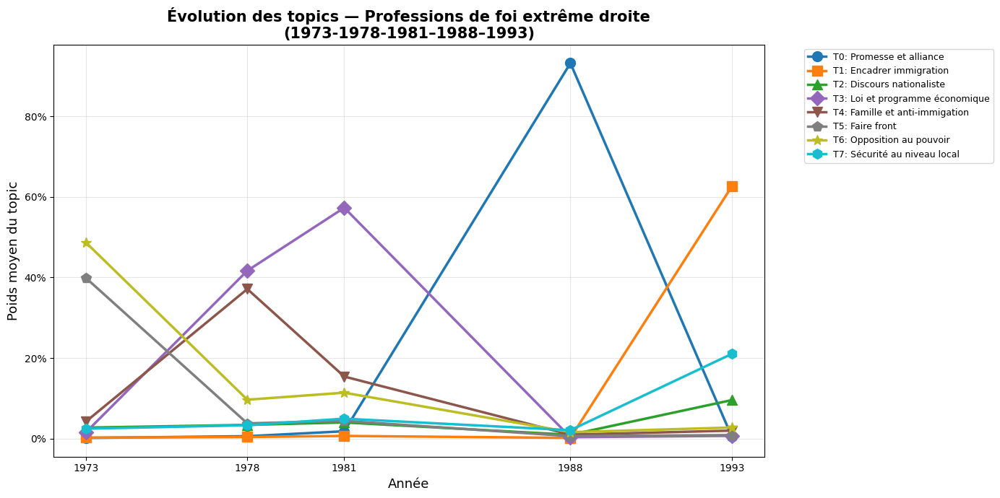

In [ ]:


fig, ax = plt.subplots(figsize=(14, 7))
pal     = plt.cm.tab10(np.linspace(0, 1, N_TOPICS_NMF))
mkrs    = ['o','s','^','D','v','p','*','h']
years_avail = sorted(by_year.index.tolist())

for i, col in enumerate(by_year.columns):
    ax.plot(years_avail, by_year.loc[years_avail, col],
            marker=mkrs[i % len(mkrs)], lw=2.5, ms=10,
            label=col, color=pal[i])

ax.set_xticks(years_avail)
ax.set_xlabel('Année', fontsize=13)
ax.set_ylabel('Poids moyen du topic', fontsize=13)
ax.set_title('Évolution des topics — Professions de foi extrême droite\n(1973-1978-1981–1988–1993)',
             fontsize=15, fontweight='bold')
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9)
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('topic_evolution.png', dpi=150, bbox_inches='tight')
plt.show()

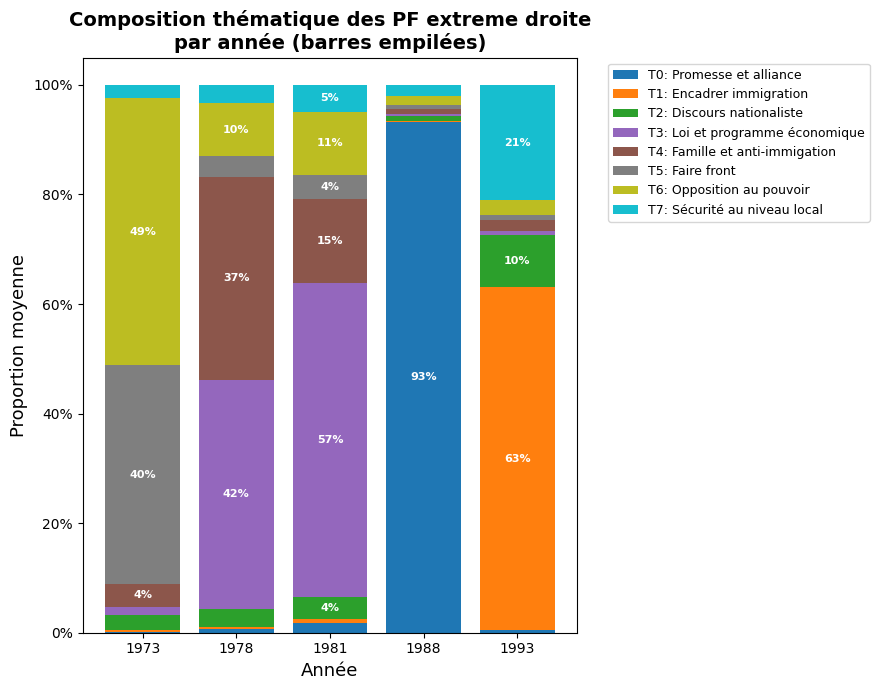

In [27]:
# ── Graphique 2 : barres empilées — composition thématique par année ──────────
fig, ax = plt.subplots(figsize=(9, 7))
bottom  = np.zeros(len(years_avail))
xlabels = [str(y) for y in years_avail]

for i, col in enumerate(by_year.columns):
    vals = by_year.loc[years_avail, col].values
    ax.bar(xlabels, vals, bottom=bottom, label=col, color=pal[i])
    # Afficher le % si la part est suffisamment grande
    for xi, (v, b) in enumerate(zip(vals, bottom)):
        if v > 0.04:
            ax.text(xi, b + v/2, f'{v:.0%}', ha='center', va='center',
                    fontsize=8, color='white', fontweight='bold')
    bottom += vals

ax.set_xlabel('Année', fontsize=13)
ax.set_ylabel('Proportion moyenne', fontsize=13)
ax.set_title('Composition thématique des PF extreme droite\npar année (barres empilées)',
             fontsize=14, fontweight='bold')
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
ax.set_ylim(0, 1.05)
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9)
plt.tight_layout()
plt.savefig('topic_stacked.png', dpi=150, bbox_inches='tight')
plt.show()

---
## Étape 7 — NMF séparé par année

Pour détecter les thèmes **spécifiques à chaque élection**, on entraîne un NMF indépendant par année. Cela permet de voir des topics émergents en 1993 qui n'auraient pas de poids suffisant dans le modèle global.


 ANALYSE MÉTRIQUES NMF : 1973 (169 docs)


c:\Users\Utilisateur\Documents\ENSAE\3A\nlp\nlp-project\NLP_project\.venv\Lib\site-packages\sklearn\feature_extraction\text.py:411: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['po', 'quelqu', 'sciences'] not in stop_words.
  warnings.warn(


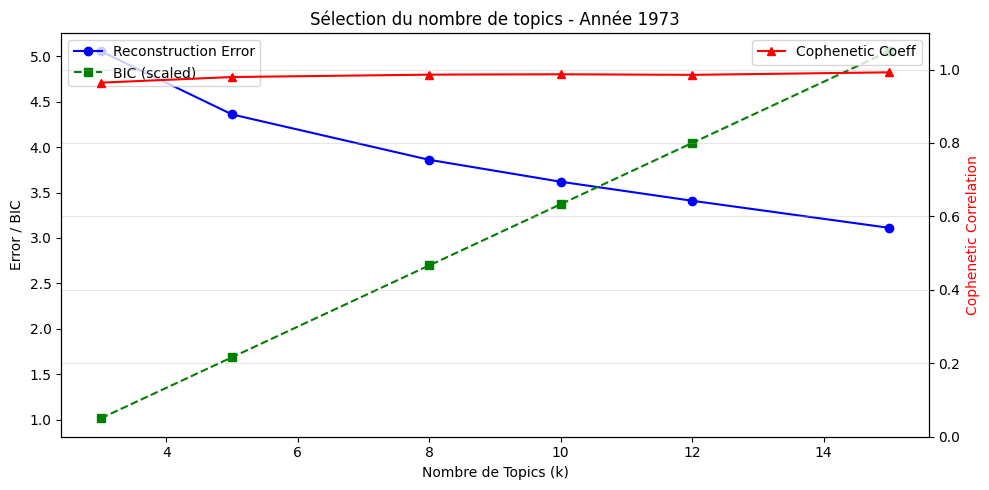


 ANALYSE MÉTRIQUES NMF : 1978 (244 docs)


c:\Users\Utilisateur\Documents\ENSAE\3A\nlp\nlp-project\NLP_project\.venv\Lib\site-packages\sklearn\feature_extraction\text.py:411: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['po', 'quelqu', 'sciences'] not in stop_words.
  warnings.warn(


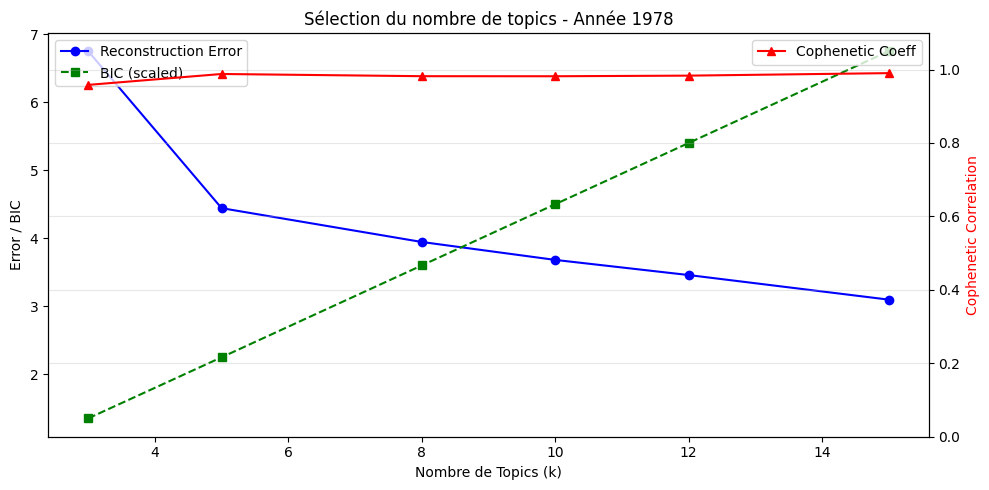


 ANALYSE MÉTRIQUES NMF : 1981 (65 docs)


c:\Users\Utilisateur\Documents\ENSAE\3A\nlp\nlp-project\NLP_project\.venv\Lib\site-packages\sklearn\feature_extraction\text.py:411: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['po', 'quelqu', 'sciences'] not in stop_words.
  warnings.warn(


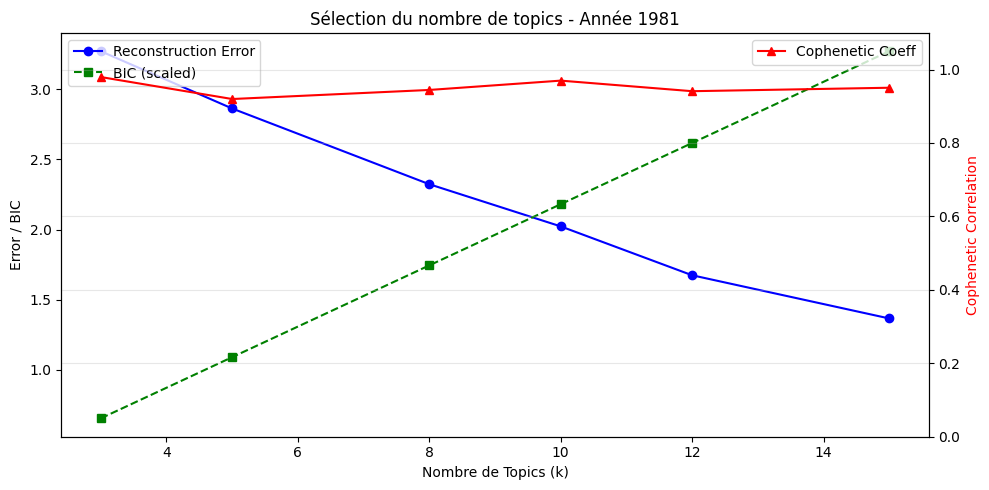


 ANALYSE MÉTRIQUES NMF : 1988 (550 docs)


c:\Users\Utilisateur\Documents\ENSAE\3A\nlp\nlp-project\NLP_project\.venv\Lib\site-packages\sklearn\feature_extraction\text.py:411: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['po', 'quelqu', 'sciences'] not in stop_words.
  warnings.warn(


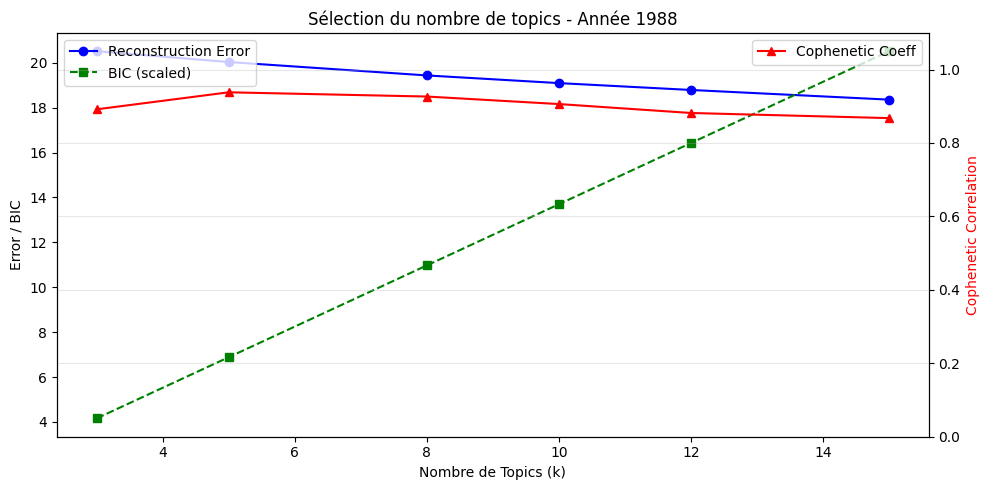


 ANALYSE MÉTRIQUES NMF : 1993 (721 docs)


c:\Users\Utilisateur\Documents\ENSAE\3A\nlp\nlp-project\NLP_project\.venv\Lib\site-packages\sklearn\feature_extraction\text.py:411: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['po', 'quelqu', 'sciences'] not in stop_words.
  warnings.warn(


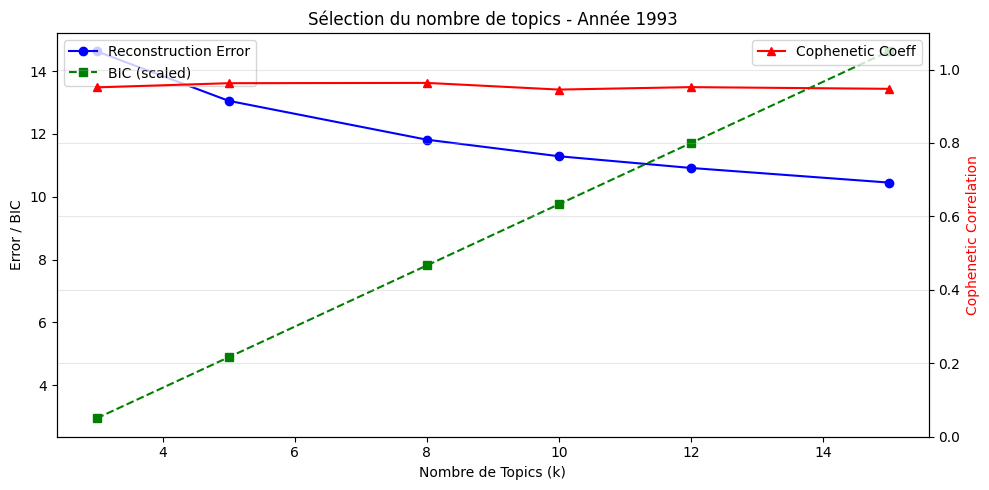

In [23]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import linkage, cophenet
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import NMF

# --- Fonctions utilitaires ---
def calculate_bic(reconstruction_err, n_samples, n_features, n_topics):
    n_params = n_topics * (n_samples + n_features)
    return reconstruction_err**2 + n_params * np.log(n_samples)

def calculate_cophenetic(W):
    if W.shape[0] < 2: return 0
    z = linkage(W, method='average')
    c, coph_dists = cophenet(z, pdist(W))
    return c

# --- Paramètres ---
YEARS = [1973, 1978, 1981, 1988, 1993]
topics_range = [3, 5, 8, 10, 12, 15] # Ajusté pour des sous-corpus plus petits

for year in YEARS:
    sub = df_ed[df_ed['year'] == year]
    n = len(sub)
    print(f"\n{'='*60}\n ANALYSE MÉTRIQUES NMF : {year} ({n} docs)\n{'='*60}")

    if n < 10:
        print(f" Corpus trop petit pour une analyse de sélection ({n} docs).")
        continue

    # Vectorisation TF-IDF
    vec = TfidfVectorizer(max_features=800, stop_words=list(ALL_SW), 
                          min_df=2, max_df=0.95, ngram_range=(1, 2))
    mat = vec.fit_transform(sub['text_lemmatized'])
    n_samples, n_features = mat.shape

    # Boucle de calcul des métriques
    results = []
    # On s'assure que k ne dépasse pas le nombre de documents
    valid_range = [k for k in topics_range if k < n]

    for k in valid_range:
        nmf_model = NMF(n_components=k, init='nndsvda', random_state=42, max_iter=400)
        W = nmf_model.fit_transform(mat)
        
        err = nmf_model.reconstruction_err_
        bic = calculate_bic(err, n_samples, n_features, k)
        coph = calculate_cophenetic(W)
        
        results.append({'k': k, 'error': err, 'bic': bic, 'cophenetic': coph})

    df_res = pd.DataFrame(results)

    # --- Génération du graphique par année ---
    fig, ax1 = plt.subplots(figsize=(10, 5))

    # Axe gauche : Error et BIC
    ax1.plot(df_res['k'], df_res['error'], 'b-o', label='Reconstruction Error')
    # Normalisation du BIC pour l'affichage visuel
    bic_scaled = df_res['bic'] / df_res['bic'].max() * df_res['error'].max()
    ax1.plot(df_res['k'], bic_scaled, 'g--s', label='BIC (scaled)')
    ax1.set_xlabel('Nombre de Topics (k)')
    ax1.set_ylabel('Error / BIC', color='k')

    # Axe droit : Cophenetic
    ax2 = ax1.twinx()
    ax2.plot(df_res['k'], df_res['cophenetic'], 'r-^', label='Cophenetic Coeff')
    ax2.set_ylabel('Cophenetic Correlation', color='r')
    ax2.set_ylim(0, 1.1) # Le coeff est entre 0 et 1

    plt.title(f"Sélection du nombre de topics - Année {year}")
    ax1.legend(loc='upper left')
    ax2.legend(loc='upper right')
    plt.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

In [48]:
N_T_YEAR = 5   # d'après l'analyse c'est un nombre ok pour chaque année. 
YEARS = [1973, 1978, 1981, 1988, 1993]
for year in YEARS:
    sub = df_ed[df_ed['year'] == year]
    n   = len(sub)
    print(f"\n{'─'*60}")
    print(f" {year} — {n} professions de foi")
    print(f"{'─'*60}")

    if n < 10:
        # Corpus trop petit → afficher simplement les mots les plus fréquents
        print(f"  Corpus trop petit pour NMF ({n} docs).")
        print("  Mots les plus fréquents (hors stopwords) :")
        words = [w for t in sub['text_lemmatized'] for w in t.split()
                 if w not in ALL_SW and len(w) >= 4]
        top20 = [w for w, _ in Counter(words).most_common(20)]
        print(f"  {', '.join(top20)}")
        continue

    vec = TfidfVectorizer(
        max_features=800, stop_words=list(ALL_SW),
        min_df=2, max_df=0.95, ngram_range=(1, 2)
    )
    mat = vec.fit_transform(sub['text_lemmatized'])

    nmf_y = NMF(n_components=N_T_YEAR, init='nndsvda', random_state=42)
    nmf_y.fit(mat)

    fn_y = vec.get_feature_names_out()
    for t_idx, topic in enumerate(nmf_y.components_):
        top = [fn_y[j] for j in np.argsort(-topic)[:12]]
        print(f"  Topic {t_idx+1} : {', '.join(top)}")


────────────────────────────────────────────────────────────
 1973 — 169 professions de foi
────────────────────────────────────────────────────────────
  Topic 1 : défendu, français, public, loi, pouvoir, france, commun, pays, tion, tolérable, administratif, expansion
  Topic 2 : alliance républicaine, républicaine, majorité, majorité présidentielle, présidentielle, alliance, reconnaître, refuser, pompidou, demander, entendre, république
  Topic 3 : etat, famille, droit, défense, majorité, français, nation, communiste, enfant, europe, travail, loi
  Topic 4 : français, falloir, france, pays, défense, vie, économique, pouvoir, famille, ancien, liberté, contrôle
  Topic 5 : public, pouvoir, avenir, intérêt, falloir, service, république, entreprise, enfant, présidentielle, agir, homme

────────────────────────────────────────────────────────────
 1978 — 244 professions de foi
────────────────────────────────────────────────────────────


c:\Users\Utilisateur\Documents\ENSAE\3A\nlp\nlp-project\NLP_project\.venv\Lib\site-packages\sklearn\feature_extraction\text.py:411: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['po', 'quelqu', 'sciences'] not in stop_words.
  warnings.warn(
c:\Users\Utilisateur\Documents\ENSAE\3A\nlp\nlp-project\NLP_project\.venv\Lib\site-packages\sklearn\feature_extraction\text.py:411: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['po', 'quelqu', 'sciences'] not in stop_words.
  warnings.warn(


  Topic 1 : public, enseignement, moyen, famille, retablir, catastrophique, defendre, rigoureux, penser, activité, inflation, loi
  Topic 2 : politique, travailleur, demander, mandat, charte, concerner, familial, pays, indépendance, mesure, charte immigration, montrez
  Topic 3 : opinion, chance, clair, code, gauche, pénal, code pénal, exprimer, constitution, justice, majorité, protéger
  Topic 4 : gaulliste, ancien, général, union gaulliste, progrès, gaulliste progrès, gaullisme, compagnon, union, gaulle, secrétaire, indépendance
  Topic 5 : etat, pouvoir, politique, société, loi, familial, grand, salaire, allocation, million, économique, enfant

────────────────────────────────────────────────────────────
 1981 — 65 professions de foi
────────────────────────────────────────────────────────────
  Topic 1 : public, populaire, social, majorité, économie, patrie, élire, développer, famille, liberté patrie, rétablir, rassemblement
  Topic 2 : savoir, gauche, pouvoir, opposer, réclamer, c

c:\Users\Utilisateur\Documents\ENSAE\3A\nlp\nlp-project\NLP_project\.venv\Lib\site-packages\sklearn\feature_extraction\text.py:411: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['po', 'quelqu', 'sciences'] not in stop_words.
  warnings.warn(
c:\Users\Utilisateur\Documents\ENSAE\3A\nlp\nlp-project\NLP_project\.venv\Lib\site-packages\sklearn\feature_extraction\text.py:411: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['po', 'quelqu', 'sciences'] not in stop_words.
  warnings.warn(


  Topic 1 : entente, populaire liste, liste entente, enfant, éventuel, remplaçant éventuel, remplaçant, lepen populaire, jemenin, entendre liste, pareil, carrière pareil
  Topic 2 : sich, haben, wählt, ihr, seine, deren, auf, werden, das, vertrauen, dem, ihre
  Topic 3 : paris, clergerie paris, général clergerie, rue général, clergerie, général, écrir rue, rue, nationale, entent, liste entent, écrir
  Topic 4 : fiscal, avenir redressement, redressement pays, assassin trafiquant, carrière appareil, charge fiscal, appareil, appareil travailler, fiscal social, trafiquant drogue, trafiquant, socialiste vœu
  Topic 5 : france française, amplifiez, socialisme confirmer, amplifiez pen, perdant, confiance perdant, confirmer amplifiez, perdant avenir, française socialisme, avenir france, pen présent, paris imp

────────────────────────────────────────────────────────────
 1993 — 721 professions de foi
────────────────────────────────────────────────────────────


c:\Users\Utilisateur\Documents\ENSAE\3A\nlp\nlp-project\NLP_project\.venv\Lib\site-packages\sklearn\feature_extraction\text.py:411: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['po', 'quelqu', 'sciences'] not in stop_words.
  warnings.warn(


  Topic 1 : rétablir, million, impôt, voix, carte, sauver, retraite, supprimer, immigré, main, séjour renouvelable, renouvelable
  Topic 2 : françer, dimanche, priorité, confiance, commerçant, artisan, étranger, drogue, expulsion, réduction, cercle, pouvoir
  Topic 3 : refus, maintien, place, etat, alliance, alliance populaire, création, formation, mise, instauration, homme, intérêt
  Topic 4 : progressif, suppression, effectif, droit, lutte, sauvon, défense, apprentissage, création, réduction, allègement, suspension
  Topic 5 : das, alsace, eine, dem, haben, wollen, einwanderung, steuern, daß, sind, werden, französischen


---
## Étape 8 — BERTopic + Topics Over Time

BERTopic utilise des **embeddings contextuels** (transformers) plutôt que des fréquences de mots. Il peut détecter des similarités sémantiques que LDA/NMF ratent (ex : deux PF qui parlent du même sujet avec des mots différents).

La fonctionnalité **Topics Over Time** calcule directement l'évolution de chaque topic sur la période.

In [53]:
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
from sklearn.feature_extraction.text import CountVectorizer as CV_bert

docs       = df_ed['text_clean'].tolist()    # texte nettoyé (pas lemmatisé)
timestamps = df_ed['year'].tolist()

# ── 1. Embeddings sémantiques ─────────────────────────────────────────────────
# Modèle multilingue léger — bon compromis vitesse/qualité pour le français
print("Encodage des documents...")
emb_model  = SentenceTransformer('paraphrase-multilingual-MiniLM-L12-v2')
embeddings = emb_model.encode(docs, show_progress_bar=True, batch_size=32)
print(f"Embeddings : {embeddings.shape}")

# ── 2. CountVectorizer pour les labels de topics ──────────────────────────────
vec_bert = CV_bert(stop_words=list(ALL_SW), min_df=2, ngram_range=(1, 2))

# ── 3. BERTopic ───────────────────────────────────────────────────────────────
# min_topic_size : baisser si corpus petit (ex: 5–10)
# nr_topics='auto' : fusionne automatiquement les topics trop similaires
topic_model = BERTopic(
    language='french',
    vectorizer_model=vec_bert,
    min_topic_size=5,
    nr_topics='auto',
    verbose=True
)
topics, probs = topic_model.fit_transform(docs, embeddings)

info = topic_model.get_topic_info()
print(f"\n {len(info)} topics découverts | {topics.count(-1)} outliers (topic -1)")
print(info[info['Topic'] != -1].to_string())

Encodage des documents...


Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Batches:   0%|          | 0/55 [00:00<?, ?it/s]

Embeddings : (1749, 384)


2026-04-29 23:09:29,960 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2026-04-29 23:09:35,110 - BERTopic - Dimensionality - Completed ✓
2026-04-29 23:09:35,121 - BERTopic - Cluster - Start clustering the reduced embeddings
2026-04-29 23:09:35,297 - BERTopic - Cluster - Completed ✓
2026-04-29 23:09:35,299 - BERTopic - Representation - Extracting topics using c-TF-IDF for topic reduction.
2026-04-29 23:09:37,279 - BERTopic - Representation - Completed ✓
2026-04-29 23:09:37,284 - BERTopic - Topic reduction - Reducing number of topics
2026-04-29 23:09:37,342 - BERTopic - Representation - Fine-tuning topics using representation models.
2026-04-29 23:09:38,812 - BERTopic - Representation - Completed ✓
2026-04-29 23:09:38,821 - BERTopic - Topic reduction - Reduced number of topics from 73 to 11



 11 topics découverts | 406 outliers (topic -1)
    Topic  Count                                                                     Name                                                                                                                                Representation                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                

In [ ]:
# ── Topics Over Time ──────────────────────────────────────────────────────────
# Calcule l'importance de chaque topic par période.
# C'est la réponse directe à "y a-t-il une évolution entre 1973 et 1993 ?"
tot = topic_model.topics_over_time(
    docs=docs, timestamps=timestamps,
    nr_bins=20,            # 6 périodes = une par année
    evolution_tuning=True  # lissage entre périodes
)

top_topics = [t for t in info[info['Topic'] != -1]['Topic'].values[:8]]
fig = topic_model.visualize_topics_over_time(
    tot, topics=top_topics,
    title='Topics BERTopic — PF extrême droite'
)
fig.show()

0it [00:00, ?it/s]

5it [00:01,  3.33it/s]


In [ ]:
#fig.write_html("bertopic_majeurs.html")

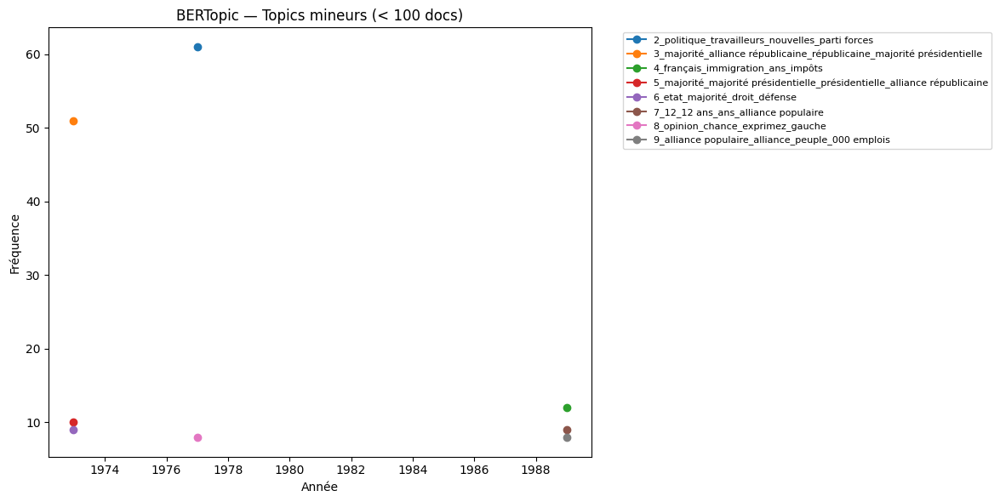

In [ ]:

# # ── Séparation des topics par taille ─────────────────────────────────────────
# big_topics   = info[(info['Topic'] != -1) & (info['Count'] >= 100)]['Topic'].tolist()
# small_topics = info[(info['Topic'] != -1) & (info['Count'] < 100)]['Topic'].tolist()

# # ── Topics over time recalculé avec moins de bins pour les petits topics ──────
# tot_big = topic_model.topics_over_time(
#     docs=docs, timestamps=timestamps,
#     nr_bins=10,
#     evolution_tuning=True
# )
# tot_small = topic_model.topics_over_time(
#     docs=docs, timestamps=timestamps,
#     nr_bins=5,   # moins de bins pour les topics rares
#     evolution_tuning=True
# )

# fig, ax = plt.subplots(figsize=(12, 6))

# for topic_id in small_topics:
#     subset = tot_small[tot_small['Topic'] == topic_id]
#     if subset.empty:
#         continue
#     label = info[info['Topic'] == topic_id]['Name'].values[0]
#     ax.plot(subset['Timestamp'], subset['Frequency'], marker='o', label=label)

# ax.set_title('BERTopic — Topics mineurs (< 100 docs)')
# ax.set_xlabel('Année')
# ax.set_ylabel('Fréquence')
# ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)
# plt.tight_layout()
# plt.savefig('bertopic_mineurs.png', dpi=150, bbox_inches='tight')
# plt.show()

In [64]:
# ── Carte 2D des documents ────────────────────────────────────────────────────
# Chaque point = une profession de foi ; documents proches = sémantiquement similaires
topic_model.visualize_documents(
    docs=docs, embeddings=embeddings,
    topics=top_topics,
    hide_annotations=False,
    height=700, width=1100,
    title='Carte sémantique des PF extrème droite'
)

---
## Étape 9 — Synthèse : mots distinctifs par année

Pour compléter l'analyse, on calcule les mots les plus **caractéristiques de chaque année** en traitant chaque année comme un mega-document et en calculant un TF-IDF inter-années. Un score élevé pour 1993 = ce mot est utilisé *surtout* en 1993.

In [28]:
year_mega = {y: ' '.join(df_ed[df_ed['year']==y]['text_lemmatized'].tolist())
             for y in YEARS if (df_ed['year']==y).sum() > 0}

if len(year_mega) >= 2:
    ys  = sorted(year_mega)
    vec = TfidfVectorizer(max_features=400, stop_words=list(ALL_SW), min_df=1)
    mat = vec.fit_transform([year_mega[y] for y in ys])
    fn  = vec.get_feature_names_out()

    print("MOTS LES PLUS DISTINCTIFS PAR ANNÉE")
    print("(TF-IDF inter-années : score élevé = utilisé surtout cette année-là)")
    for i, year in enumerate(ys):
        sc   = mat[i].toarray().flatten()
        top  = [fn[j] for j in np.argsort(-sc)[:25] if sc[j] > 0]
        n_docs = (df_ed['year'] == year).sum()
        print(f"\n{'='*55}")
        print(f" {year}  ({n_docs} PF) :")
        print(f"{'='*55}")
        for k in range(0, len(top), 5):
            print('  ' + '  |  '.join(top[k:k+5]))


MOTS LES PLUS DISTINCTIFS PAR ANNÉE
(TF-IDF inter-années : score élevé = utilisé surtout cette année-là)

 1973  (169 PF) :
  majorité  |  social  |  français  |  politique  |  public
  pouvoir  |  france  |  défendu  |  loi  |  pays
  faire  |  communiste  |  alliance  |  etat  |  programme
  commun  |  refuser  |  liberté  |  vie  |  éducation
  savoir  |  reconnaître  |  devoir  |  gouvernement  |  république

 1978  (244 PF) :
  français  |  politique  |  france  |  grève  |  social
  pays  |  famille  |  majorité  |  public  |  loi
  mesure  |  gauche  |  travailleur  |  liberté  |  immigré
  parti  |  indépendance  |  véritable  |  travail  |  entreprise
  immigration  |  ancien  |  demander  |  enseignement  |  droit

 1981  (65 PF) :
  liberté  |  français  |  gauche  |  majorité  |  france
  public  |  enseignement  |  politique  |  faire  |  rassemblement
  social  |  populaire  |  économie  |  mitterrand  |  falloir
  communiste  |  famille  |  entreprise  |  loi  |  pays
  

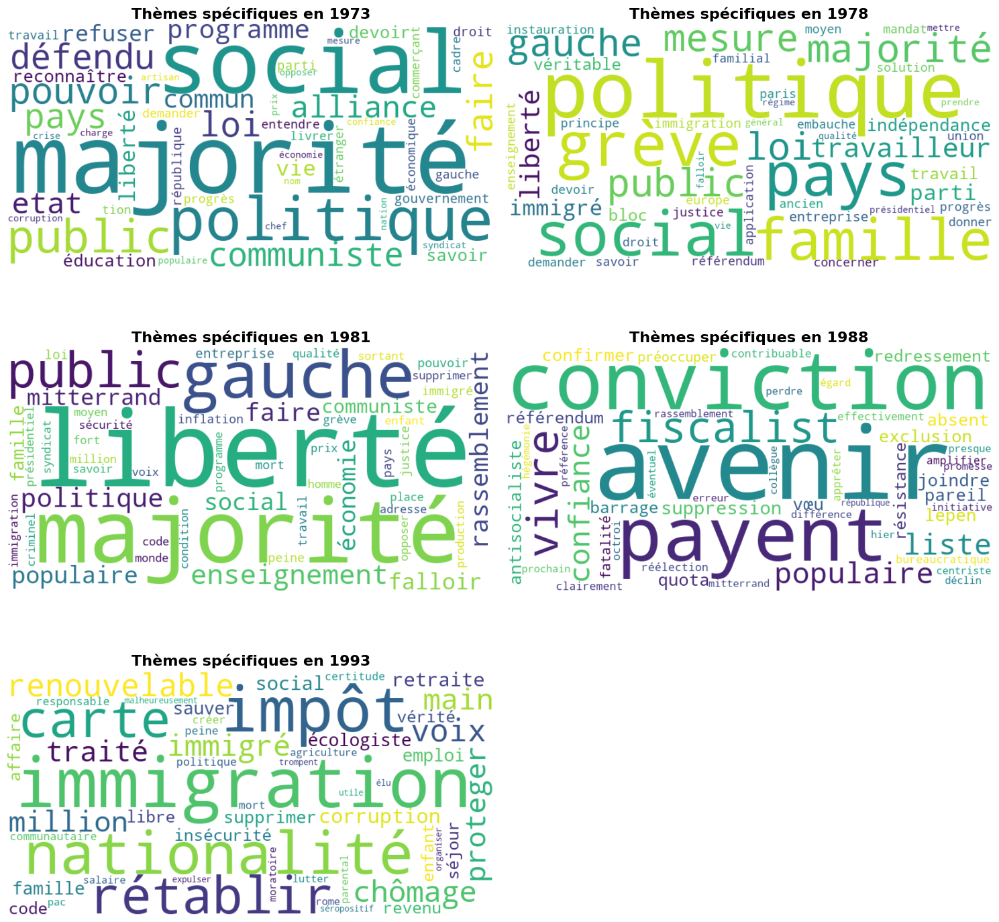

In [31]:
# rajout des wordclouds 
from wordcloud import WordCloud
import matplotlib.pyplot as plt
# 1. Mise à jour des stopwords spécifiques
# On ajoute les variantes pour être sûr de tout capter (OCR inclus parfois)
extra_sw = {'france', 'français', 'française', 'françaises'}
ALL_SW_EXTENDED = ALL_SW.union(extra_sw)

if len(year_mega) >= 2:
    ys  = sorted(year_mega)
    # On utilise ALL_SW_EXTENDED ici
    vec = TfidfVectorizer(max_features=400, stop_words=list(ALL_SW_EXTENDED), min_df=1)
    mat = vec.fit_transform([year_mega[y] for y in ys])
    fn  = vec.get_feature_names_out()

    # --- Génération des WordClouds ---
    n_years = len(ys)
    n_rows = (n_years + 1) // 2
    fig, axes = plt.subplots(n_rows, 2, figsize=(15, n_rows * 5))
    axes = axes.flatten()

    for i, year in enumerate(ys):
        sc = mat[i].toarray().flatten()
        
        # On récupère les 100 meilleurs scores
        word_scores = {fn[j]: sc[j] for j in np.argsort(-sc)[:100] if sc[j] > 0}
        
        # On définit une couleur spécifique par année pour le style
        color_list = ['#d7191c', '#fdae61', '#abd9e9', '#4575b4', '#313695']
        
        wc = WordCloud(
            background_color='white',
            max_words=50,
            colormap='viridis', # Palette lisible
            width=800, height=400
        ).generate_from_frequencies(word_scores)
        
        axes[i].imshow(wc, interpolation='bilinear')
        axes[i].set_title(f"Thèmes spécifiques en {year}", fontsize=16, fontweight='bold')
        axes[i].axis('off')

    # Nettoyage des axes vides
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()